In [721]:
using LightGraphs, Distances, Plots, DataStructures

In [3]:
function createGraph2D(X::Array,k::Integer)
    G=Graph(size(X,1))
    for i=1:size(X,1)
        L=[(euclidean(X[i,:],X[j,:]),j) for j=1:size(X,1)]
        sort!(L,by = x -> x[1])
        for m=2:k+1
            add_edge!(G, i, L[m][2])
        end
    end
    return G
end

createGraph2D (generic function with 1 method)

In [4]:
function createGraph2D2(X::Array,d::Number)
    G=Graph(size(X,1))
    for i=1:size(X,1)
        L=[euclidean(X[i,:],X[j,:]) for j=1:size(X,1)]
        for m=1:size(X,1) 
            if L[m]<d && m!=i
                add_edge!(G, i, m)
            end
        end
    end
    return G
end

createGraph2D2 (generic function with 1 method)

In [106]:
#dX=pairwise(Euclidean(),X');

In [718]:
typeof(G)

LightGraphs.SimpleGraphs.SimpleGraph{Int64}

In [107]:
#@time G=createGraph2D(X,3)

In [108]:
#@time G2=createGraph2D2(X,0.04)

In [97]:
#gplot(G)

In [96]:
#gplot(G2)

In [30]:
#=
data = [randn(100,1)-10; randn(100,1)+10]
h= std(data)*(4/3/length(data))^(1/5);
tpdf(x) =phi(x+10)/2+phi(x-10)/2;
phi(x) = exp.(-.5*x.^2)/sqrt(2*pi)
kernel(x) = mean(phi((x-data)/h)/h)
kpdf(x) = kernel.(x)
density(X)=kpdf(X)
X2=[(data[i],density(data)[i]) for i=1:length(data)]
sort!(X2, by = x -> x[1]); X2;
=#

In [32]:
#=
pyplot()
Xa=[X2[i][1] for i=1:length(X2)]
Xb=[X2[i][2] for i=1:length(X2)]
plot(Xa,Xb)
x = linspace(-25,+25,1000)
plot!(x,tpdf(x))
plot!(x,kpdf(x))
=#

In [33]:
#=
data = rand(250,2)
h= std(data)*(4/3/size(data,1))^(1/5);
tpdf(x) =phi(x+10)/2+phi(x-10)/2;
phi(x) = exp.(-.5*x.^2)/sqrt(2*pi)
kernel(x) = mean(phi((x-data)/h)/h)
kpdf(x) = kernel.(x)
density(X)=kpdf(sqrt.(X[:,1].^2.+X[:,2].^2))
=#

In [34]:
#pyplot()
#plot(data[:,1],data[:,2],density(data),linetype=:surface)

In [438]:
#using Plots 

In [35]:
#X=[i for i in linspace(0,1,500),   j =1:500];
#Y=X';

In [36]:
#plot(X,Y,kpdf(sqrt.(X.^2.+Y.^2)),linetype=:surface)

In [720]:
G2=LightGraphs.SimpleGraphs.SimpleGraph{Int64}(1)

{1, 0} undirected simple Int64 graph

In [261]:
function density2D(data::Array)
    h= std(data)*(4/3/size(data,1))^(1/5);
    tpdf(x) =phi(x+10)/2+phi(x-10)/2;
    phi(x) = exp.(-.5*x.^2)/sqrt(2*pi)
    kernel(x) = mean(phi((x-data)/h)/h)
    kpdf(x) = kernel.(x)
    return kpdf(sqrt.(data[:,1].^2.+data[:,2].^2))
end

density2D (generic function with 1 method)

In [419]:
#X=randn(600,2);

In [420]:
#f=density2D(X)

In [421]:
#G=createGraph2D2(X,0.3)

In [363]:
function Clustering(G::LightGraphs.SimpleGraphs.SimpleGraph{Int64},f::Array,tao::Number)
    n=length(f)
    g=zeros(n);
    r=[i for i in 1:n]
    v = 1:length(f)
    pair = [v f];
    pair = sortrows(pair,rev=true,by=x->x[2]);
    dictpair=Dict(zip(v,f));
    u=IntDisjointSets(n);
    for i in Int.(pair[:,1])
        nG=neighbors(G,i);
        nGi=[j for j in nG if j<i];
        if length(nGi)==0
            #vertex is a peak of f within G
            r[i]=i;
        else
            ff(i)=dictpair[i];
            g[i]=nGi[indmax(ff.(nGi))]
            ei = find_root(u, Int.(g[i]))
            union!(u,ei,i);
            eiV=[i for i=1:n if in_same_set(u,ei,i)];
            for j in nGi
                e=find_root(u,j)
                eV=[i for i=1:n if in_same_set(u,e,i)];
                if e!=ei && min(minimum(f[r[eV]]),minimum(f[r[eiV]]))<f[i] + tao
                    root_union!(u,e,ei)
                    e2=[eV;eiV];
                    r[e2]=e2[indmax(ff.(e2))];
                    eiV=e2
                    ei=e;
                end
            end
        end
    end
    return [Set([find_root(u,i) for i=1:n if f[r[find_root(u,i)]]>=tao]),u]
end

Clustering (generic function with 1 method)

In [402]:
gr()

Plots.GRBackend()

In [648]:
A=readdlm("C:\\Users\\User\\Documents\\NCTS\\FCPS\\01FCPSdata\\TwoDiamonds.lrn");

In [649]:
A=float.(A[5:end,2:3]);

In [650]:
#scatter(A[:,1],A[:,2])

In [697]:
function PlotClustering(X::Array,S::Set,u::DataStructures.IntDisjointSets)
    S2=[s for s in S]
    Xs=[]
    for j=1:length(S2)
        Xs=push!(Xs,[i for i=1:length(f) if in_same_set(u,S2[j],i)])
    end
    plt=scatter();
    for arr in Xs,j in 1:endof(S2)
        plt=scatter!(X[arr,1],X[arr,2],label=S2[j])
    end
    points=0
    for arr in Xs
        points=points+length(arr)
    end
    return points,plt
end

PlotClustering (generic function with 2 methods)

In [698]:
f=density2D(A);
G=createGraph2D(A,3)
S,u=Clustering(G,f,0.2)
S

Set([76, 272])

In [699]:
points,plt=PlotClustering(A,S,u)

(794, Plot{Plots.GRBackend() n=4})

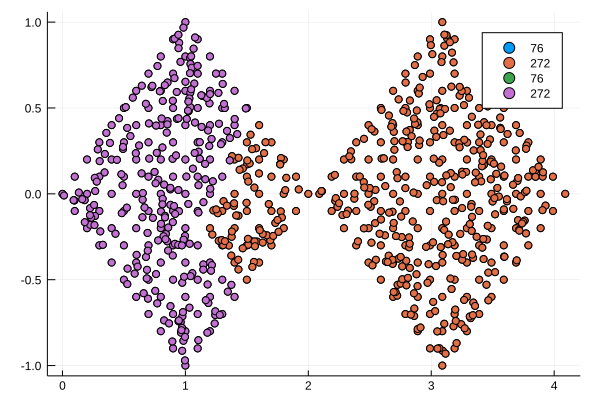

In [700]:
plot(plt)

In [701]:
B=readdlm("C:\\Users\\User\\Documents\\NCTS\\FCPS\\01FCPSdata\\WingNut.lrn");

In [702]:
B=float.(B[5:end,2:3]);

In [703]:
#scatter(B[:,1],B[:,2])

In [704]:
G=createGraph2D(B,3)
f=density2D(B)
S,u=Clustering(G,f,0.2)
S

Set([253, 255, 113, 22])

In [705]:
points,plt=PlotClustering(B,S,u)

(1011, Plot{Plots.GRBackend() n=16})

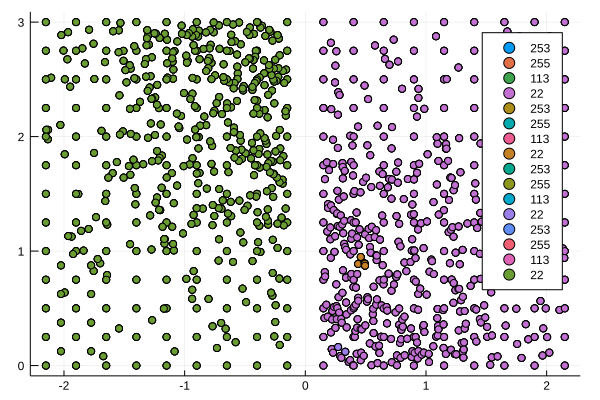

In [706]:
plot(plt)

In [707]:
C=readdlm("C:\\Users\\User\\Documents\\NCTS\\FCPS\\01FCPSdata\\Target.lrn");

In [708]:
C=float.(C[5:end,2:3]);

In [709]:
scatter(C[:,1],C[:,2]);

In [710]:
G=createGraph2D(C,5)
f=density2D(C)
S,u=Clustering(G,f,0.01)
S

Set([176, 444])

In [711]:
points,plt=PlotClustering(C,S,u)

(770, Plot{Plots.GRBackend() n=4})

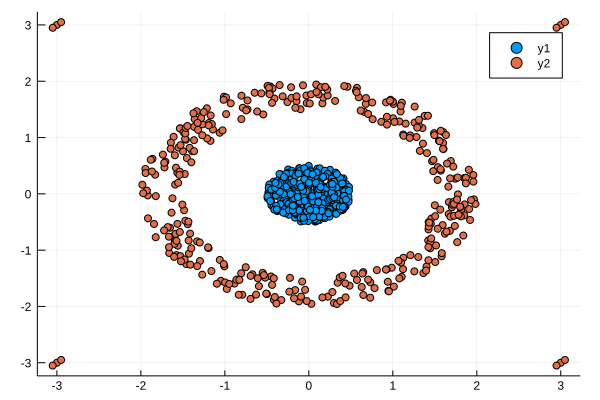

In [639]:
plot(plt)

In [712]:
D=readdlm("C:\\Users\\User\\Documents\\NCTS\\FCPS\\01FCPSdata\\EngyTime.lrn")

4100×4 Array{Any,2}:
     "%"  4096           ""        ""  
     "%"     3           ""        ""  
     "%"     9          1         1    
     "%"      "Key"      "C1"      "C2"
    1        1.38826    2.0761     ""  
    2        2.17725    3.1023     ""  
    3        0.378645   5.30761    ""  
    4        3.68173    1.62268    ""  
    5        2.46286    2.7779     ""  
    6        1.73595    3.82709    ""  
    7        1.16799    5.5181     ""  
    8        1.80711    3.25099    ""  
    9        3.50864    1.84339    ""  
    ⋮                                  
 4085        1.06589    0.051733   ""  
 4086        1.15566    1.10151    ""  
 4087        1.60078    0.987838   ""  
 4088        2.26978    0.47362    ""  
 4089        1.45623   -0.859784   ""  
 4090        0.403097  -1.03698    ""  
 4091        0.424346   0.696647   ""  
 4092        0.909687   0.375763   ""  
 4093        2.69838    0.511262   ""  
 4094        1.0788     1.52615    ""  
 4095        1.9748

In [713]:
D=float.(D[5:end,2:3]);

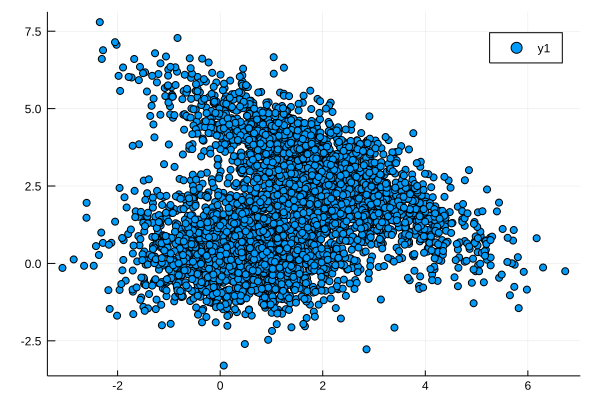

In [714]:
scatter(D[:,1],D[:,2])

In [715]:
G=createGraph2D2(D,0.187)
f=density2D(D)
S,u=Clustering(G,f,0.3)
S

Set([3482, 3918, 2371, 2484, 3592, 2118, 3722, 3144, 3486, 2390, 2905, 3238, 3369])

In [716]:
points,plt=PlotClustering(D,S,u)

(3810, Plot{Plots.GRBackend() n=169})

In [717]:
plt